
# Car object detection

### Introduction
The field of computer vision has made remarkable strides in recent years, revolutionizing industries ranging from autonomous vehicles to security systems. Car object detection, a pivotal subfield of computer vision, has gained increasing significance as it plays a vital role in enhancing road safety, traffic management, and the development of self-driving cars. This project, "Car Object Detection," endeavors to contribute to this dynamic and essential area by leveraging cutting-edge deep learning techniques to accurately detect and track cars in real-time.

### Problem overview
The primary objective of this project is to develop a robust car object detection system capable of accurately identifying and tracking cars within static images. It involves locating cars, determining their positions, and ensuring precise detection while excluding pedestrians. Key aspects of the problem include handling occlusion, achieving high detection accuracy, and distinguishing between vehicles and other objects within the static image. While this project is tailored for static images, it lays the foundation for broader applications such as traffic management, security surveillance, and autonomous navigation.

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#TensorFlow can train and run deep neural networks. 
#It can also help load data to train the model, and deploy it using TensorFlow Serving
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense

from pathlib import Path
#These are specific layers from the Keras API, which is now integrated into TensorFlow.
#These layers are building blocks for constructing neural network models.
#Conv2D: Convolutional layer for 2D spatial convolution.
#Input: Input layer for defining the input shape.
#BatchNormalization: Layer that normalizes its inputs.

In [2]:
#Reading images using Pathh library

train_path = Path("training_images")
test_path = Path("testing_images")

In [3]:
#Reading dataset
train = pd.read_csv("train_solution_bounding_boxes (1).csv")

#converting data types into integer
train[['xmin', 'ymin', 'xmax', 'ymax']] = train[['xmin', 'ymin', 'xmax', 'ymax']].astype(int)

#dropping duplicate rows
train.drop_duplicates(subset='image', inplace=True, ignore_index=True)

This code reads a CSV file containing bounding box data for a car object detection project, ensures that the relevant columns have integer data types, and removes duplicate rows based on the 'image' column. This data preprocessing step helps prepare the dataset for further use, such as training a machine learning model for car object detection.

In [4]:
def display_image(img, bbox_coords=[], pred_coords=[], norm=False):
    # if the image has been normalized, scale it up
    if norm:
        img *= 255.
        img = img.astype(np.uint8)
    
    # Draw the bounding boxes
    if len(bbox_coords) == 4:
        xmin, ymin, xmax, ymax = bbox_coords
        img = cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 3)
        
    if len(pred_coords) == 4:
        xmin, ymin, xmax, ymax = pred_coords
        img = cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (255, 0, 0), 3)
        
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    
def display_image_from_file(name, bbox_coords=[], path=train_path):
    img = cv2.imread(str(path/name))
    display_image(img, bbox_coords=bbox_coords)
    
def display_from_dataframe(row, path=train_path):
    display_image_from_file(row['image'], bbox_coords=(row.xmin, row.ymin, row.xmax, row.ymax), path=path)
    

def display_grid(df=train, n_items=3):
    plt.figure(figsize=(20, 10))
    #display_grid: This function creates a grid of images by selecting a random subset of entries from a DataFrame (df).
    # get 3 random entries and plot them in a 1x3 grid
    rand_indices = [np.random.randint(0, df.shape[0]) for _ in range(n_items)]
    
    for pos, index in enumerate(rand_indices):
        plt.subplot(1, n_items, pos + 1)
        display_from_dataframe(df.loc[index, :])
        
#The bounding box coordinates are expected in the format (xmin, ymin, xmax, ymax).
#The function uses green color for the ground truth bounding box (bbox_coords) and 
#red color for the predicted bounding box (pred_coords).         

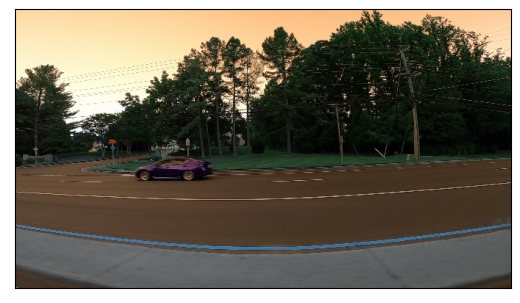

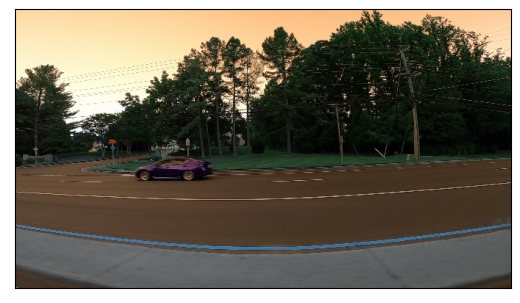

In [5]:
display_image_from_file("vid_4_10500.jpg")

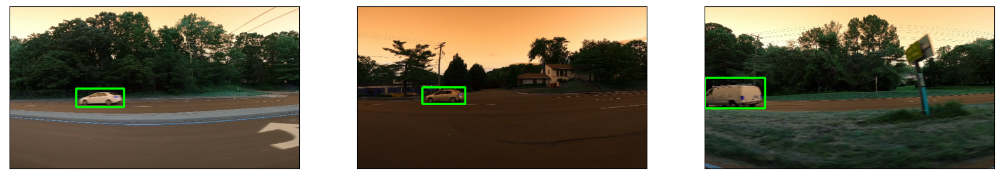

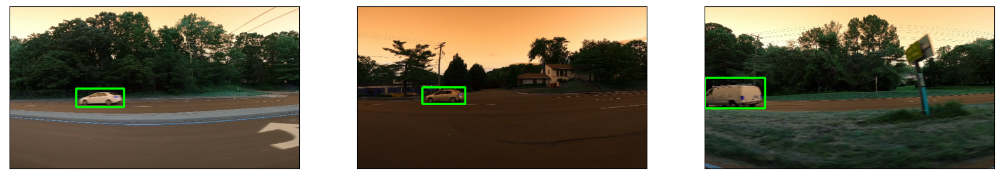

In [6]:
display_grid()

In [7]:
def data_generator(df=train, batch_size=16, path=train_path):
    while True:        
        images = np.zeros((batch_size, 380, 676, 3))
        bounding_box_coords = np.zeros((batch_size, 4))
        
        for i in range(batch_size):
                rand_index = np.random.randint(0, train.shape[0])
                row = df.loc[rand_index, :]
                images[i] = cv2.imread(str(train_path/row.image)) / 255.
                bounding_box_coords[i] = np.array([row.xmin, row.ymin, row.xmax, row.ymax])
                
        yield {'image': images}, {'coords': bounding_box_coords}

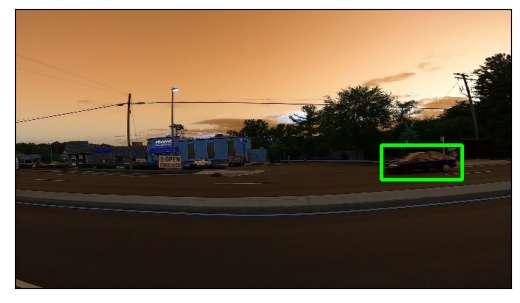

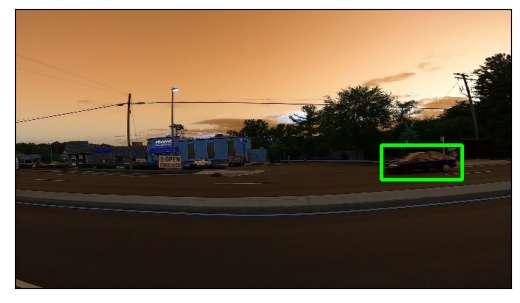

In [8]:
# Test the generator
example, label = next(data_generator(batch_size=1))
img = example['image'][0]
bbox_coords = label['coords'][0]

display_image(img, bbox_coords=bbox_coords, norm=True)

In [9]:
input_ = Input(shape=[380, 676, 3], name='image')

x = input_

for i in range(10):
    n_filters = 2**(i + 3)
    x = Conv2D(n_filters, 3, activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPool2D(2, padding='same')(x)

x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dense(32, activation='relu')(x)
output = Dense(4, name='coords')(x)

model = tf.keras.models.Model(input_, output)
model.summary()
#Model: This creates a Keras model using the functional API. It takes the input and output tensors to define the model architecture.
#model.summary(): This prints a summary of the model architecture, including the type and shape of each layer and the total number of parameters.

Model: "model"
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
_________________________________________________________________
 image (InputLayer)          [(None, 380, 676, 3)]     0         
 Layer (type)                Output Shape              Param #   
                                                                 
 conv2d (Conv2D)             (None, 380, 676, 8)       224       
 image (InputLayer)          [(None, 380, 676, 3)]     0         
                                                                 
                                                                 
 batch_normalization (BatchN  (None, 380, 676, 8)      32        
 ormalization)                                                   
 conv2d (Conv2D)             (None, 380, 676, 8)       224       
                                                                 
 batch_normalization (BatchN  (None, 380, 676,

 batch_normalization_7 (Batc  (None, 3, 6, 1024)       4096      
 hNormalization)                                                 
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 2, 3, 1024)       0         
 conv2d_7 (Conv2D)           (None, 3, 6, 1024)        4719616   
                                                                 
 batch_normalization_7 (Batc  (None, 3, 6, 1024)       4096      
 hNormalization)                                                 
                                                                 
 2D)                                                             
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 2, 3, 1024)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 2, 3, 2048)        18876416  
          

In [10]:
model.compile(
    loss={
        'coords': 'mse'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics={
        'coords': 'accuracy'
    }
)

In [11]:
# Some functions to test the model. These will be called every epoch to display the current performance of the model
def test_model(model, datagen):
    example, label = next(datagen)
    
    X = example['image']
    y = label['coords']
    
    pred_bbox = model.predict(X)[0]
    
    img = X[0]
    gt_coords = y[0]
    
    display_image(img, pred_coords=pred_bbox, norm=True)

def test(model):
    datagen = data_generator(batch_size=1)
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model, datagen)    
    plt.show()
    
class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        
#ShowTestImages: This is a custom Keras callback class that inherits from tf.keras.callbacks.Callback.
#It overrides the on_epoch_end method, which is called at the end of each training epoch. In this method,
#it calls the test function to visualize the performance of the model at the end of each epoch.

1/1 [==============================] - 0s 83ms/step


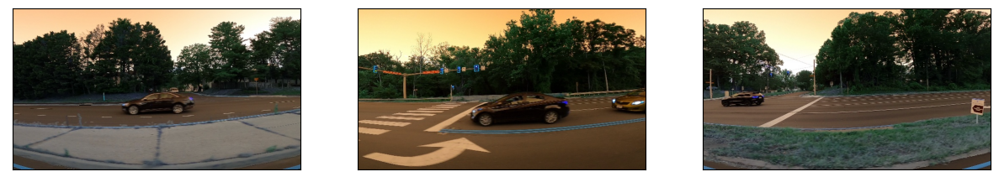

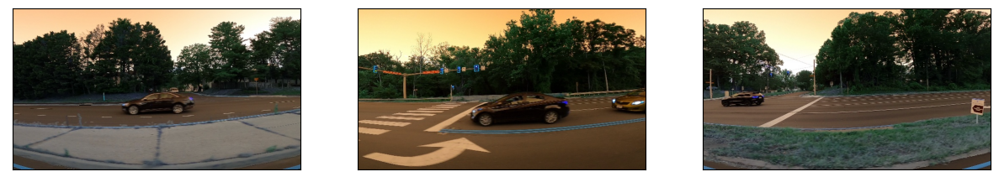

In [12]:
test(model)

Epoch 1/9
Epoch 1/9
1/1 [==============================] - 0s 90ms/step


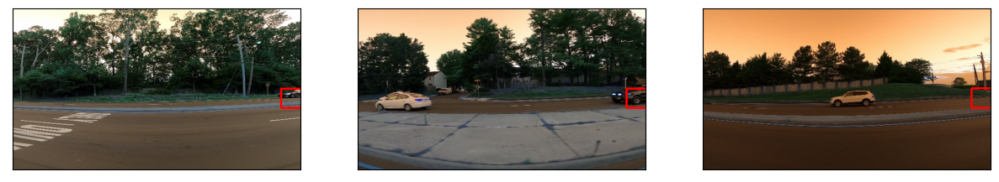

100/100 [==============================] - 744s 7s/step - loss: 15509.5088 - accuracy: 0.6888
Epoch 2/9


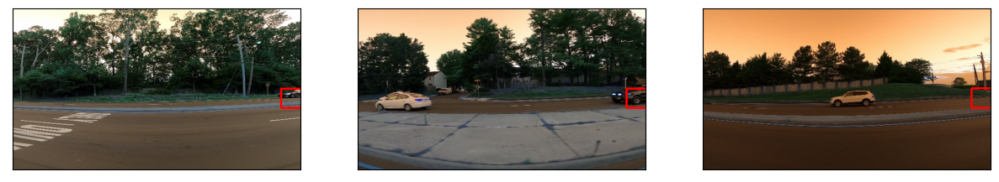

100/100 [==============================] - 744s 7s/step - loss: 15509.5088 - accuracy: 0.6888
Epoch 2/9
1/1 [==============================] - 0s 121ms/step


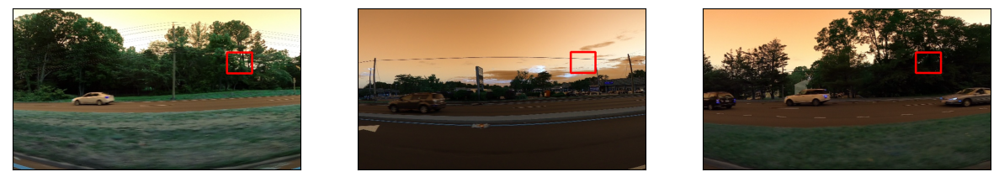

100/100 [==============================] - 753s 8s/step - loss: 2463.8076 - accuracy: 0.9438
Epoch 3/9


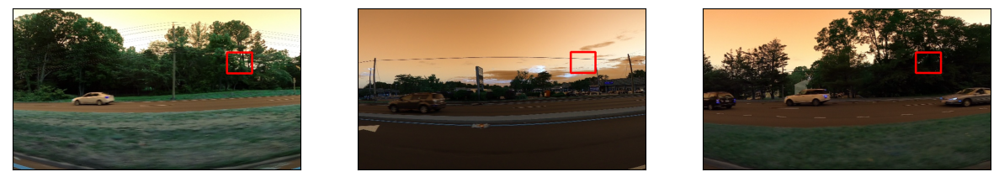

100/100 [==============================] - 753s 8s/step - loss: 2463.8076 - accuracy: 0.9438
Epoch 3/9
1/1 [==============================] - 0s 86ms/step


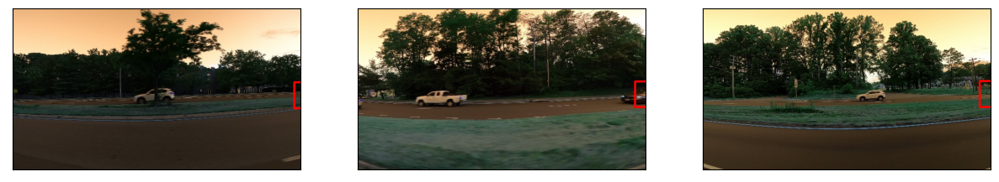

100/100 [==============================] - 749s 7s/step - loss: 1595.4314 - accuracy: 0.9488
Epoch 4/9


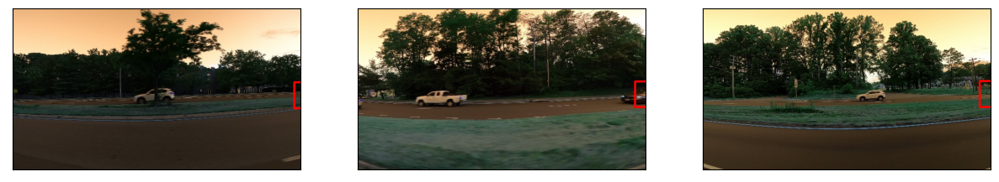

100/100 [==============================] - 749s 7s/step - loss: 1595.4314 - accuracy: 0.9488
Epoch 4/9
1/1 [==============================] - 0s 104ms/step


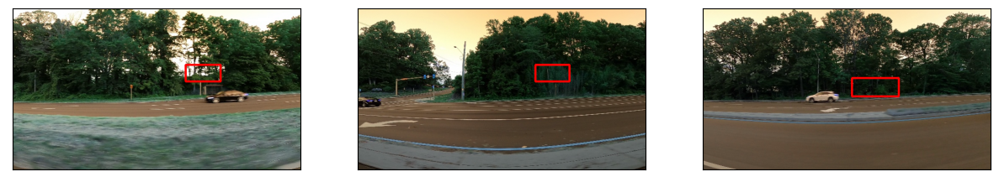

100/100 [==============================] - 751s 8s/step - loss: 1229.8853 - accuracy: 0.9550
Epoch 5/9


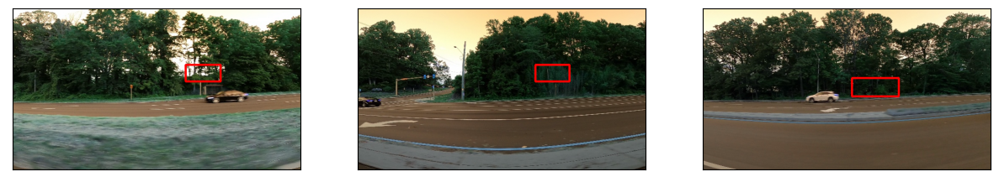

100/100 [==============================] - 751s 8s/step - loss: 1229.8853 - accuracy: 0.9550
Epoch 5/9
1/1 [==============================] - 0s 96ms/step


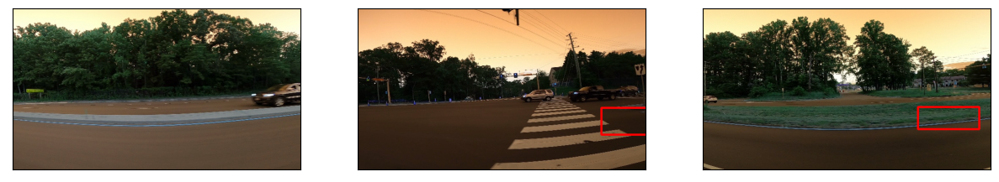

100/100 [==============================] - 798s 8s/step - loss: 1132.2476 - accuracy: 0.9656
Epoch 6/9


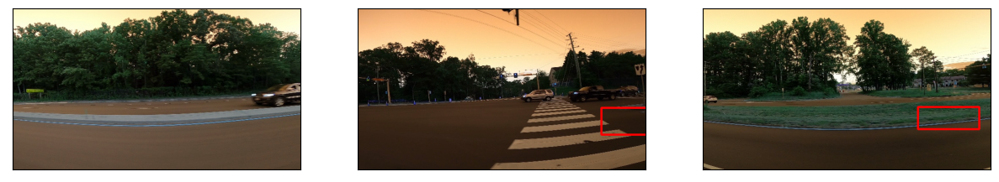

100/100 [==============================] - 798s 8s/step - loss: 1132.2476 - accuracy: 0.9656
Epoch 6/9
1/1 [==============================] - 0s 107ms/step


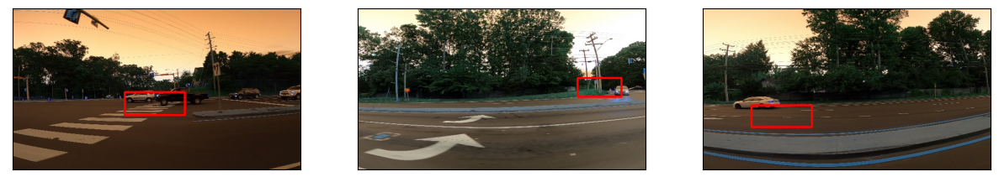

100/100 [==============================] - 825s 8s/step - loss: 959.4486 - accuracy: 0.9644
Epoch 7/9


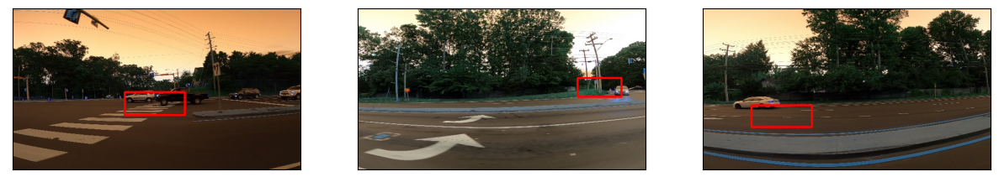

100/100 [==============================] - 825s 8s/step - loss: 959.4486 - accuracy: 0.9644
Epoch 7/9
1/1 [==============================] - 0s 86ms/step


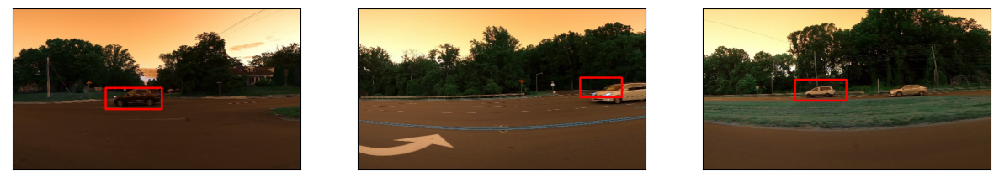

100/100 [==============================] - 886s 9s/step - loss: 642.9088 - accuracy: 0.9694
Epoch 8/9


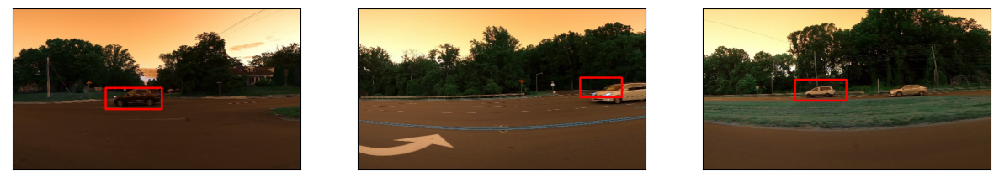

100/100 [==============================] - 886s 9s/step - loss: 642.9088 - accuracy: 0.9694
Epoch 8/9
1/1 [==============================] - 0s 82ms/step


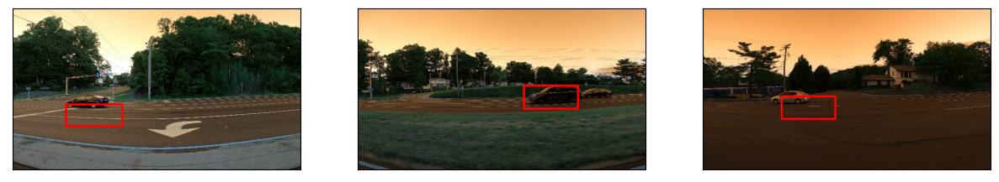

100/100 [==============================] - 687s 7s/step - loss: 589.6782 - accuracy: 0.9744
Epoch 9/9


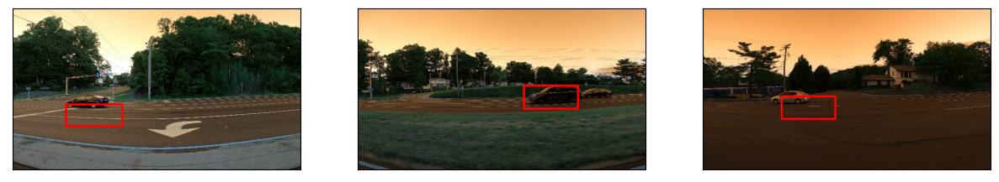

100/100 [==============================] - 687s 7s/step - loss: 589.6782 - accuracy: 0.9744
Epoch 9/9
1/1 [==============================] - 0s 81ms/step


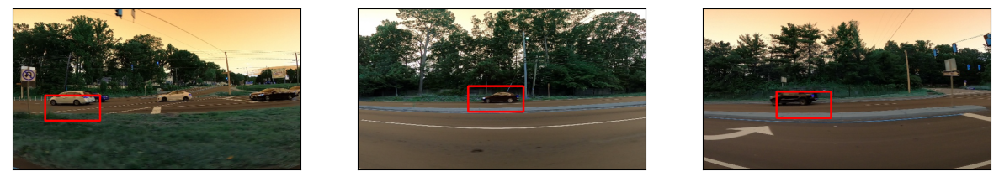

100/100 [==============================] - 690s 7s/step - loss: 553.2212 - accuracy: 0.9663


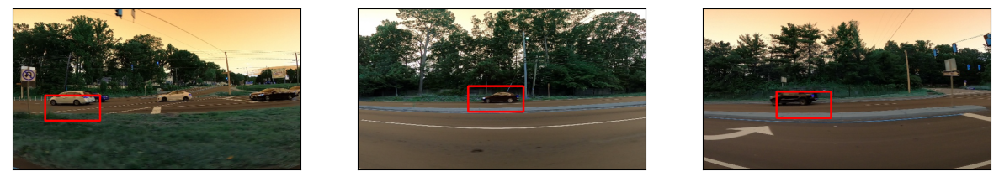

100/100 [==============================] - 690s 7s/step - loss: 553.2212 - accuracy: 0.9663


In [13]:
with tf.device('/GPU:0'):
    _ = model.fit(
        data_generator(),
        epochs=9,
        steps_per_epoch=100,
        callbacks=[
            ShowTestImages(),
        ]
    )